In [6]:
import networkx as nx
import random
from itertools import combinations, count
import numpy as np
import matplotlib.pyplot as plt
# create number for each group to allow use of colormap
from itertools import count, product
import osmnx as ox
import graph_funcs as gf
import os
import general_file_handling as gfh
import prepare_raster as pr

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
from rasterio.plot import plotting_extent
import pandas as pd

from itertools import product
from tqdm import trange
from joblib import Parallel, delayed
from tqdm.notebook import trange, tqdm

from itertools import product

import pickle    
from matplotlib.lines import Line2D
import matplotlib as mpl
import seaborn as sns


c:\Users\hanna\Anaconda3\envs\geothings_ox\Lib\site-packages\osmnx\projection.py:3: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd
c:\Users\hanna\Anaconda3\envs\geothings_ox\Lib\site-packages\libpysal\cg\alpha_shapes.py:38: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator

In [ ]:
from importlib.metadata import version
version('osmnx')
from collections import Counter, defaultdict

from rasterio.plot import show
from rasterio.merge import merge
import rasterio as rio
from pathlib import Path
import glob
from shapely.geometry import Point, LineString

import routing_funcs as rf


## Load Graph

In [ ]:
pathname = '../Data/dem2/ASTGTMV003_N08W074'

In [ ]:

nodes_g_dtypes= {'street_count': np.float64}
edges_g_dtypes= {'risk': np.float64, 'cost': np.float64}

G_tt = ox.io.load_graphml(filepath=pathname+'_graph_G_final.osm', node_dtypes=nodes_g_dtypes, edge_dtypes=edges_g_dtypes)
nodes,edges = ox.utils_graph.graph_to_gdfs(G_tt)
G_wrl_un = G_tt.to_undirected(reciprocal=False, as_view=False)
a = [c for c in sorted(nx.connected_components(G_wrl_un), key=len, reverse=True)]
S0 = G_wrl_un.subgraph(a[0]).copy()
#make gdf from graph
# nodes_g, edges_g = ox.utils_graph.graph_to_gdfs(S0)
S0_un = S0.to_undirected()


## Dijkstra fields to labs

In [13]:
nodes,edges = ox.utils_graph.graph_to_gdfs(S0_un)

In [15]:
nodes_fields = nodes.loc[nodes['type'] == 'field']
nodes_labs = nodes.loc[nodes['type'] == 'laboratory']

nodes_fields = nodes_fields.to_crs(21899) #Pick another
nodes_fields['geometry'] = nodes_fields['geometry'].buffer(10000)

nodes_labs = nodes_labs.to_crs(21899) #Pick another

# df = df.to_crs(4326) #Back to 4326

In [ ]:
startstop = []
for i_f, row_field in tqdm(nodes_fields.iterrows(), total=855):
    # print(row_field)
    for i_l, row_lab in nodes_labs.iterrows():
        if row_field.geometry.contains(row_lab.geometry):
            startstop.append([i_f, i_l])

In [ ]:
len(startstop)

In [ ]:
fieldslabslist = startstop

In [ ]:
num_cores = 3
pths_df = pd.DataFrame(columns=['source','target', 'path', 'distance'])

print("else")
# if __name__ == "__main__":
print("main")
#TODO: create external limit distance variable
#TODO: tqdm werkt niet?
#TODO: G seems redundant
processed_list = Parallel(n_jobs=num_cores)(delayed(rf.dijkstra_mp)(S0_un, inp, startstop, 'fields_labs') for inp in tqdm(['risk', 'cost','travel_time']))

# for node in processed_list:
#     df = pd.concat([pd.DataFrame([node], columns=pths_df.columns), pths_df], ignore_index=True)

### Select labs

In [17]:
data_pths = ["./labs_fields*.pk","./labs_fields_cost*.pk","./labs_fields_risk*.pk"]

In [ ]:
# fl_shrt_time, pths_time = select_pths("./labs_fields_time*.pk")
fl_shrt_time, pths_time = rf.select_pths("./labs_fields_traveltime/labs_fields*.pk")
fl_shrt_cost, pths_cost = rf.select_pths("./labs_fields_cost*.pk")
fl_shrt_risk, pths_risk = rf.select_pths("./labs_fields_risk*.pk")

         source    target                                               path  \
67395  64840833  64825990  [64840833, 64837736, 64831227, 64833043, 64825...   
67420  64840833  64959158  [64840833, 64837736, 64841489, 64850472, 64914...   
67399  64840833  64861625  [64840833, 64837736, 64841489, 64850472, 76441...   
67389  64840833  64805597  [64840833, 64837736, 64841489, 64850472, 64914...   
67403  64840833  64865913  [64840833, 64837736, 64841489, 64850472, 76441...   

       distance  
67395     320.6  
67420    1299.5  
67399    2333.2  
67389    2368.3  
67403    2390.6  
         source    target                                               path  \
54615  64681666  64701602                     [64681666, 64712062, 64701602]   
54565  64681666  64668021           [64681666, 64712062, 64693870, 64668021]   
54605  64681666  64739375  [64681666, 64712062, 7105423620, 64744678, 647...   
54592  64681666  64764297  [64681666, 64712062, 7105423620, 64758184, 647...   
54606  6468

## Dijkstra labs to ports

In [17]:
labs = []
for i in fl_shrt_time:
    labs.append(i[1])

for i in fl_shrt_cost:
    labs.append(i[1])

for i in fl_shrt_risk:
    labs.append(i[1])


labs = set(labs)


#European ports
#ESALG	BEANR DEHAM FRLEH NLRTM BEZEE NLVLI
ports = [30704232, 55656241, 63436176, 49658438, 56020150, 54529718, 55039437] #, 39117466, 55039457]




In [18]:
startstop_ports = list(product(labs, ports))


In [ ]:
num_cores = 3
processed_list = Parallel(n_jobs=num_cores)(delayed(rf.dijkstra_mp)(S0_un, inp, startstop_ports, 'lab_ports') for inp in tqdm(['travel_time', 'risk', 'cost']))


  0%|          | 0/3 [00:00<?, ?it/s]

## Paths to graph

In [ ]:
lp_shrt_time, lp_pths_time = rf.select_pths("./lab_ports_travel_time*.pk")
lp_shrt_cost, lp_pths_cost = rf.select_pths("./lab_ports_cost*.pk")
lp_shrt_risk, lp_pths_risk = rf.select_pths("./lab_ports_risk*.pk")

        source    target                                               path  \
4311  65552397  30704232  [65552397, 65547701, 65553426, 677120912, 6771...   
4308  65552397  49658438  [65552397, 65547701, 65553426, 677120912, 6771...   
4305  65552397  55039437  [65552397, 65547701, 65553426, 677120912, 6771...   
4306  65552397  54529718  [65552397, 65547701, 65553426, 677120912, 6771...   
4307  65552397  56020150  [65552397, 65547701, 65553426, 677120912, 6771...   

       distance  
4311  1307606.5  
4308  1311419.4  
4305  1338673.6  
4306  1345415.7  
4307  1363959.1  
        source    target                                               path  \
4306  65552397  54529718  [65552397, 65547701, 65553426, 677120912, 6771...   
4307  65552397  56020150  [65552397, 65547701, 65553426, 677120912, 6771...   
4308  65552397  49658438  [65552397, 65547701, 65553426, 677120912, 6771...   
4309  65552397  63436176  [65552397, 65547701, 65553426, 677120912, 6771...   
4310  65552397  556562

In [ ]:
nx.set_edge_attributes(S0_un,0, name='count')
G_fields_cost = rf.add_paths_to_graph(S0_un,pths_cost, True)
nx.set_edge_attributes(S0_un,0, name='count')
G_fields_time = rf.add_paths_to_graph(S0_un,pths_time, True)
nx.set_edge_attributes(S0_un,0, name='count')
G_fields_risk = rf.add_paths_to_graph(S0_un,pths_risk, True)

3769
3760
3432


In [ ]:
nx.set_edge_attributes(S0_un,0, name='count')
G_ports_time = rf.add_paths_to_graph(S0_un,lp_pths_time, True)
nx.set_edge_attributes(S0_un,0, name='count')
G_ports_cost = rf.add_paths_to_graph(S0_un,lp_pths_cost, True)
nx.set_edge_attributes(S0_un,0, name='count')
G_ports_risk = rf.add_paths_to_graph(S0_un,lp_pths_risk, True)

48901
39909
32284


## Plotting fields to labs

In [16]:
def coloring(row):
    if row['type']== 'airstrip':
        row['color'] = 'red'
    if row['type']== 'port':
        row['color'] = 'purple'
    if row['type']== 'field':
        row['color'] = 'yellow'
    if row['type']== 'laboratory':
        row['color'] = 'magenta'
    if row['type']== 'port_small':
        row['color'] = 'pink'

    
    return row

In [17]:
color_dct_en = {'road': "Road", 'water_road': "Water road connection", 'water': "Waterway", 'water_road_overside': "Water road connection", 'field_connect': "Cultivation field connecting road", 'airstrip_connect': "Airstrip connecting road", 'lab_connect': "Laboratory connecting road", 'port_connect': "Large port connecting road", 'port_connect_small':'Small port connecting road', "sea": "Seaway", 'air': 'Airway'}
color_dct_nn = {'airstrip': 'Airstrip', 'port': 'Large port','port_small': 'Small port', 'field': 'Cultivation field', 'laboratory': 'Laboratory'}

In [18]:
small_coords_wr =[-74.0001388888889, 7.999861111111111, -72.99986111111112, 9.00013888888889]

d,  b, c, a = small_coords_wr
# small_coords_wr = [a,b,c,d]

# G_wrl_cnct = ox.truncate.truncate_graph_bbox(G_tt, bbox = small_coords_wr, truncate_by_edge=False, retain_all=False)
G_list = [ G_fields_time, G_fields_cost, G_fields_risk]
G_names = ['Travel Time',"Cost",  'Risk']

air_edges = gf.get_edges_wth_attr(S0_un, 'type', 'air')
S0_un_noair = S0_un.copy()
S0_un_noair.remove_edges_from(air_edges)


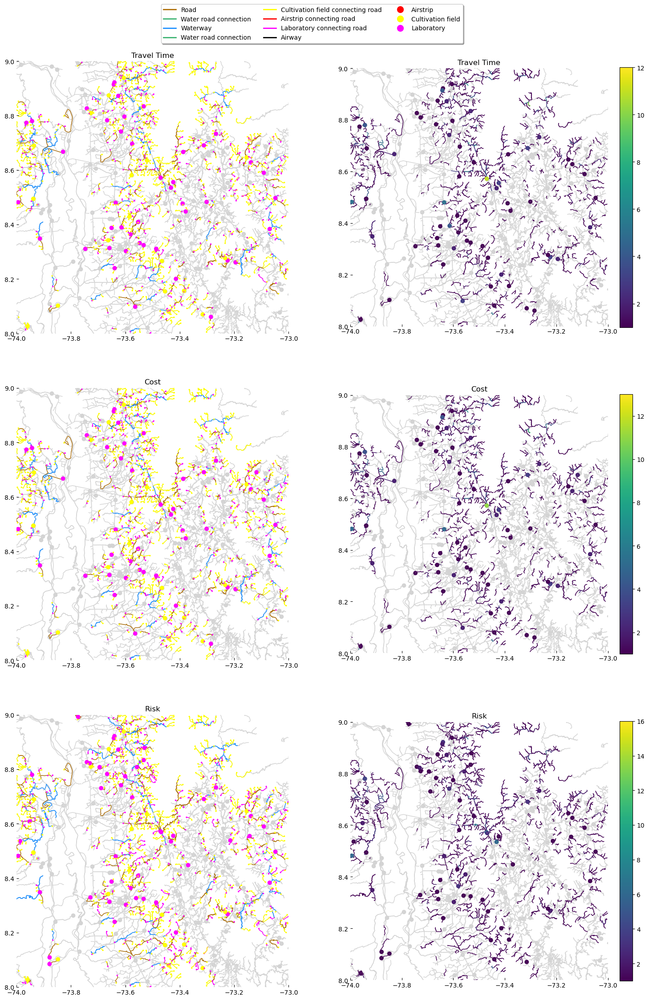

In [64]:


color_dct_edges = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", 'port_connect': "darkgreen", "sea": "darkblue", 'air': 'black'}
color_dct_nodes = {'airstrip': 'red', 'field': 'yellow', 'laboratory': 'magenta'}
color_dct_edges_leg = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", 'air': 'black'}


legend_elements =[]
for key,val in color_dct_edges_leg.items():

    legend_elements.append(Line2D([0], [0], lw=2 , color=val, label=color_dct_en[key], markerfacecolor=val, markersize=10))

for key,val in color_dct_nodes.items():

    legend_elements.append(Line2D([0], [0], marker='o', color=val, label=color_dct_nn[key], lw=0, markerfacecolor=val, markersize=10))



f, ax = plt.subplots(3,2,figsize=(18,27))



for i in range(3):
    G_weight = G_list[i] 
    for j in range(2):
        if j ==1:
            ec = ox.plot.get_edge_colors_by_attr(G_weight, "count", cmap='viridis')
        else:
            edges =  G_weight.edges(data=True)
            ec = [color_dct_edges.get(d['type']) for u,v,d in edges]


        bbox_small = [9.00013888888889, 7.999861111111111, -72.99986111111112, -74.0001388888889]
        ox.plot_graph(S0_un_noair, node_color='white', node_size=0.1, edge_linewidth = 1, edge_color='lightgrey', ax=ax[i][j], show=False, bbox = bbox_small )
        ox.plot_graph(G_weight, node_color='white', node_size=0.1, edge_linewidth = 1, edge_color=ec, ax=ax[i][j], show=False, bbox = bbox_small )
        


        if j==0:
            n,e = ox.utils_graph.graph_to_gdfs(G_weight)
            typelst = ['airstrip', 'port', 'field', 'laboratory', 'port_connect_small']
            n_select = n.loc[n['type'].isin(typelst)]
            n_select = n_select.apply(coloring, axis=1)
            n_select.plot(ax=ax[i][j], color=n_select['color'], markersize = 2)


            
        # show(dac.data, ax=ax, transform=dac.rio.transform())



        # if j == 0:
        #     ax[i][j].legend(handles=legend_elements, loc='best')
        if j == 1:
            attr = nx.get_edge_attributes(G_weight, 'count')

            cmap = 'viridis'
            norm = mpl.colors.Normalize(vmin=min(attr.values()), vmax=max(attr.values()))

            f.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax[i][j], fraction=0.046, pad=0.04)

        ax[i][j].set_aspect('equal')

        ax[i][j].get_xaxis().set_visible(True)
        ax[i][j].get_yaxis().set_visible(True)
        ax[i][j].set_title(G_names[i])
# plt.tight_layout()
f.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 0.93),
          ncol=3, fancybox=True, shadow=True)


plt.show()



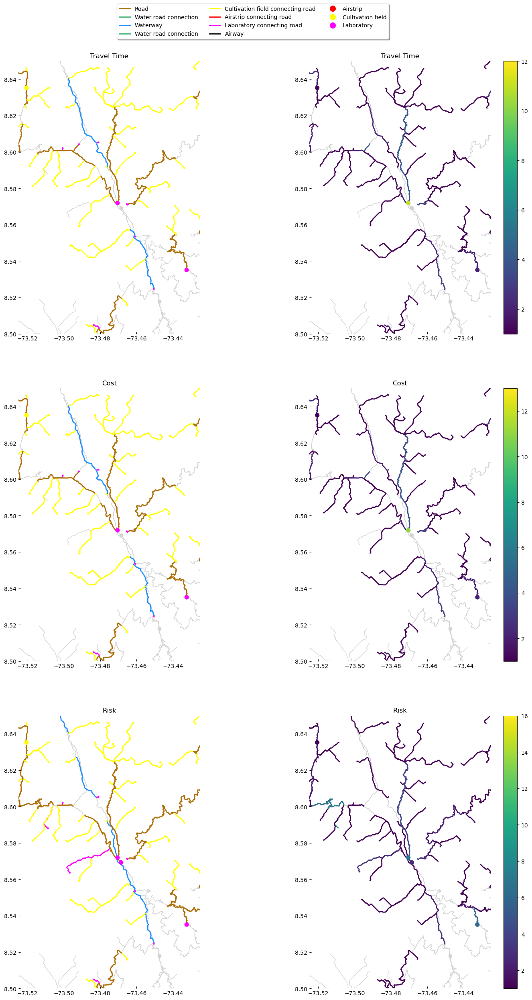

In [65]:

color_dct_edges = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", 'port_connect': "darkgreen", "sea": "darkblue", 'air': 'black'}
color_dct_nodes = {'airstrip': 'red', 'field': 'yellow', 'laboratory': 'magenta'}
color_dct_edges_leg = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", 'air': 'black'}


legend_elements =[]
for key,val in color_dct_edges_leg.items():

    legend_elements.append(Line2D([0], [0], lw=2 , color=val, label=color_dct_en[key], markerfacecolor=val, markersize=10))

for key,val in color_dct_nodes.items():

    legend_elements.append(Line2D([0], [0], marker='o', color=val, label=color_dct_nn[key], lw=0, markerfacecolor=val, markersize=10))

f, ax = plt.subplots(3,2,figsize=(18,30))



for i in range(3):
    G_weight = G_list[i] 
    for j in range(2):
        if j ==1:
            ec = ox.plot.get_edge_colors_by_attr(G_weight, "count", cmap='viridis')
        else:
            edges =  G_weight.edges(data=True)
            ec = [color_dct_edges.get(d['type']) for u,v,d in edges]


        bbox_small = [8.65, 8.5, -73.425, -73.525]
        ox.plot_graph(S0_un_noair, node_color='white', node_size=0.1, edge_linewidth = 1, edge_color='lightgrey', ax=ax[i][j], show=False, bbox = bbox_small )
        ox.plot_graph(G_weight, node_color='white', node_size=0.1, edge_linewidth = 2, edge_color=ec, ax=ax[i][j], show=False, bbox = bbox_small )

        if j==0:
            n,e = ox.utils_graph.graph_to_gdfs(G_weight)
            typelst = ['airstrip', 'port', 'field', 'laboratory', 'port_connect_small']
            n_select = n.loc[n['type'].isin(typelst)]
            n_select = n_select.apply(coloring, axis=1)
            n_select.plot(ax=ax[i][j], color=n_select['color'], markersize = 5)
            
        # show(dac.data, ax=ax, transform=dac.rio.transform())



        # if j == 0:
        #     ax[i][j].legend(handles=legend_elements, loc='best')
        if j == 1:
            attr = nx.get_edge_attributes(G_weight, 'count')

            cmap = 'viridis'
            norm = mpl.colors.Normalize(vmin=min(attr.values()), vmax=max(attr.values()))

            f.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax[i][j])

        ax[i][j].set_aspect('equal')

        ax[i][j].get_xaxis().set_visible(True)
        ax[i][j].get_yaxis().set_visible(True)
        ax[i][j].set_title(G_names[i])

f.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 0.93),
          ncol=3, fancybox=True, shadow=True)


plt.show()



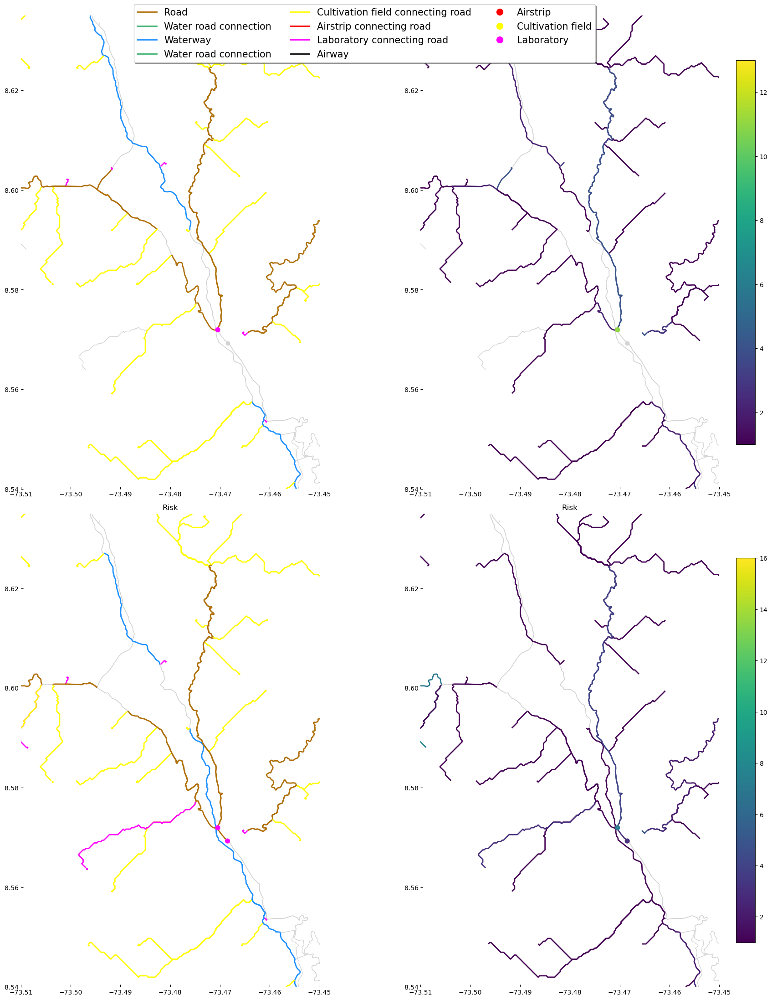

In [22]:

color_dct_edges = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", 'port_connect': "darkgreen", "sea": "darkblue", 'air': 'black'}
color_dct_nodes = {'airstrip': 'red', 'field': 'yellow', 'laboratory': 'magenta'}
color_dct_edges_leg = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", 'air': 'black'}


legend_elements =[]
for key,val in color_dct_edges_leg.items():

    legend_elements.append(Line2D([0], [0], lw=2 , color=val, label=color_dct_en[key], markerfacecolor=val, markersize=10))

for key,val in color_dct_nodes.items():

    legend_elements.append(Line2D([0], [0], marker='o', color=val, label=color_dct_nn[key], lw=0, markerfacecolor=val, markersize=10))

f, ax = plt.subplots(2,2,figsize=(18,22))



for i in range(2):
    G_weight = G_list[i+1] 
    for j in range(2):
        if j ==1:
            ec = ox.plot.get_edge_colors_by_attr(G_weight, "count", cmap='viridis')
        else:
            edges =  G_weight.edges(data=True)
            ec = [color_dct_edges.get(d['type']) for u,v,d in edges]


        bbox_small = [8.635, 8.54, -73.45, -73.51]
        ox.plot_graph(S0_un_noair, node_color='white', node_size=0.1, edge_linewidth = 1, edge_color='lightgrey', ax=ax[i][j], show=False, bbox = bbox_small )
        ox.plot_graph(G_weight, node_color='white', node_size=0.1, edge_linewidth = 2, edge_color=ec, ax=ax[i][j], show=False, bbox = bbox_small )

        if j==0:
            n,e = ox.utils_graph.graph_to_gdfs(G_weight)
            typelst = ['airstrip', 'port', 'field', 'laboratory', 'port_connect_small']
            n_select = n.loc[n['type'].isin(typelst)]
            n_select = n_select.apply(coloring, axis=1)
            n_select.plot(ax=ax[i][j], color=n_select['color'], markersize = 5)
            
        # show(dac.data, ax=ax, transform=dac.rio.transform())



        # if j == 0:
        #     ax[i][j].legend(handles=legend_elements, loc='best')
        if j == 1:
            attr = nx.get_edge_attributes(G_weight, 'count')

            cmap = 'viridis'
            norm = mpl.colors.Normalize(vmin=min(attr.values()), vmax=max(attr.values()))

            f.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax[i][j], fraction=0.046, pad=0.04)

        ax[i][j].set_aspect('equal')

        ax[i][j].get_xaxis().set_visible(True)
        ax[i][j].get_yaxis().set_visible(True)
        ax[i][j].set_title(G_names[i+1])

f.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1),
          ncol=3, fancybox=True, shadow=True, fontsize=15)

f.tight_layout()


plt.show()



In [24]:
G_list = [G_fields_cost, G_fields_time, G_fields_risk]
nodes_cost, edges_cost = ox.utils_graph.graph_to_gdfs(G_fields_cost)
nodes_risk, edges_risk = ox.utils_graph.graph_to_gdfs(G_fields_risk)
nodes_time, edges_time = ox.utils_graph.graph_to_gdfs(G_fields_time)

In [25]:
print(len(edges_cost), len(edges_time), len(edges_risk))
#2658 2712 3222


2658 2653 2557


In [26]:
print(edges_cost['count'].sum(),
edges_time['count'].sum(),
edges_risk['count'].sum())
#3769 7529 10961
#3769 3760 3432

3769 3760 3432


In [27]:
# edges_routes_clipped = edges_routes[['length', 'modality', 'grade', 'grade_abs',
#        'speed_kph', 'travel_time', 'count']]

In [28]:
edges_df_lst = [edges_time, edges_cost, edges_risk]

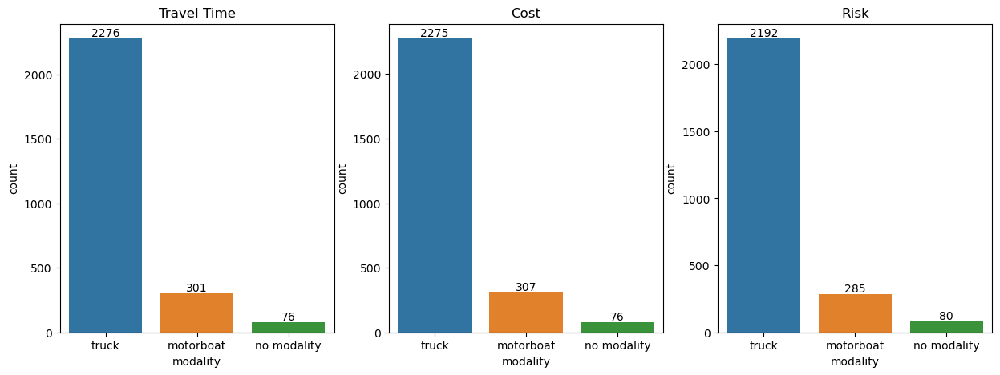

In [71]:
#TODO: plot count above bar

f, ax = plt.subplots(1,3,figsize=(15,5))

for i in range(3):
    edges_df = edges_df_lst[i]
    edges_df.loc[edges_df['length']== 0,'modality'] = 'no modality'

    # edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
    # sns.barplot(edges_routes_grouped, x="modality", y="count", ax=ax[i])

    sns.countplot(x='modality', data=edges_df, ax= ax[i])
    ax[i].bar_label(ax[i].containers[0])

    ax[i].set_title(G_names[i])

plt.show()



C:\Users\hanna\AppData\Local\Temp\ipykernel_12508\996619598.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_12508\996619598.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_12508\996619598.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or se

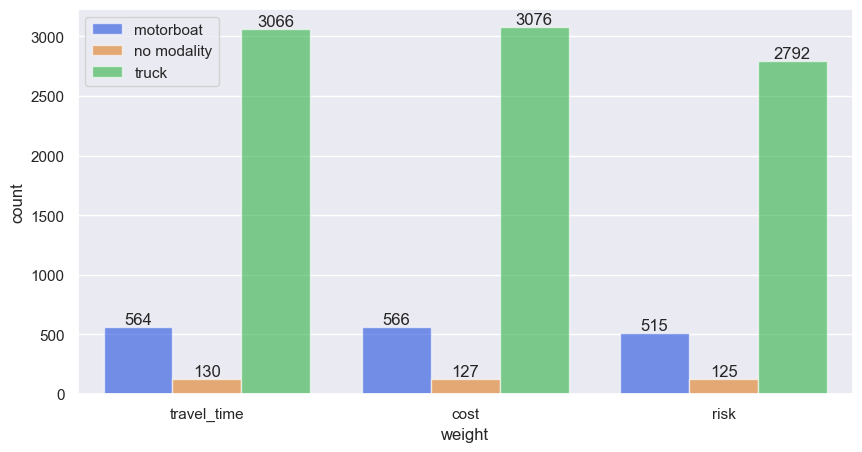

In [36]:

grouped_lst = []
labels = ['travel_time', 'cost', 'risk']


for i in range(3):
    edges_df = edges_df_lst[i]
    edges_df.loc[edges_df['length']== 0,'modality'] = 'no modality'

    edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()

    edges_routes_grouped['weight'] = labels[i]
    grouped_lst.append(edges_routes_grouped)


edges_routes_grouped = pd.concat(grouped_lst)
    
# sns.barplot(edges_routes_grouped, x="modality", y="count", ax=ax[i])

# f, ax = plt.subplots(figsize=(15,5))


sns.set(rc={"figure.figsize":(10, 5)}) #width=6, height=5

ax = sns.barplot(
    data=edges_routes_grouped,
    x="weight", y="count", hue="modality",
    palette="bright", alpha=.6
)


# sns.countplot(x='modality', data=edges_df, ax= ax[i])
for container in ax.containers:
    ax.bar_label(container)

ax.legend(loc='upper left')

# ax.set_title(G_names[i])

plt.show()

C:\Users\hanna\AppData\Local\Temp\ipykernel_12508\3402233077.py:19: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_12508\3402233077.py:19: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_12508\3402233077.py:19: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only

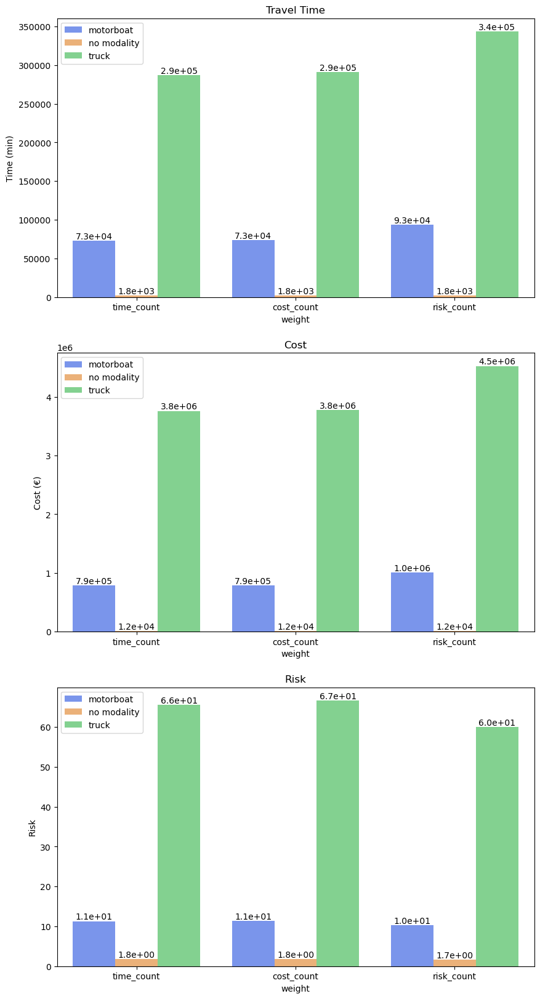

In [34]:
f, ax = plt.subplots(3,figsize=(10,20))
labels = ['time_count', 'cost_count', 'risk_count']
y_labels = ['Time (min)', 'Cost (€)', 'Risk']
edges_df_lst = [edges_time, edges_cost, edges_risk]
#TODO: multiply

grouped_lst = []

#TODO: multiply

for i in range(3):

    edges_df = edges_df_lst[i]
    edges_df.loc[edges_df['length']== 0,'modality'] = 'no modality'
    edges_df['cost_count'] = edges_df['cost']*edges_df['count']
    edges_df['time_count'] = edges_df['travel_time']*edges_df['count']
    edges_df['risk_count'] = edges_df['risk']*edges_df['count']

    edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
   

    edges_routes_grouped['weight'] = labels[i]
    grouped_lst.append(edges_routes_grouped)


edges_routes_grouped = pd.concat(grouped_lst)
    




for i in range(3):
    ax[i] = sns.barplot(
    data=edges_routes_grouped,
    x="weight", y=labels[i], hue="modality",
    palette="bright", alpha=.6, ax=ax[i])


    # sns.countplot(x='modality', data=edges_df, ax= ax[i])
    for container in ax[i].containers:
        ax[i].bar_label(container, fmt='%.1e')

    ax[i].legend(loc='upper left')

    # ax[i].bar_label(ax[i].containers[0])
    ax[i].set_title(G_names[i])
    ax[i].set_ylabel(y_labels[i])

plt.show()

C:\Users\hanna\AppData\Local\Temp\ipykernel_12508\4138346379.py:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_12508\4138346379.py:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_12508\4138346379.py:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only

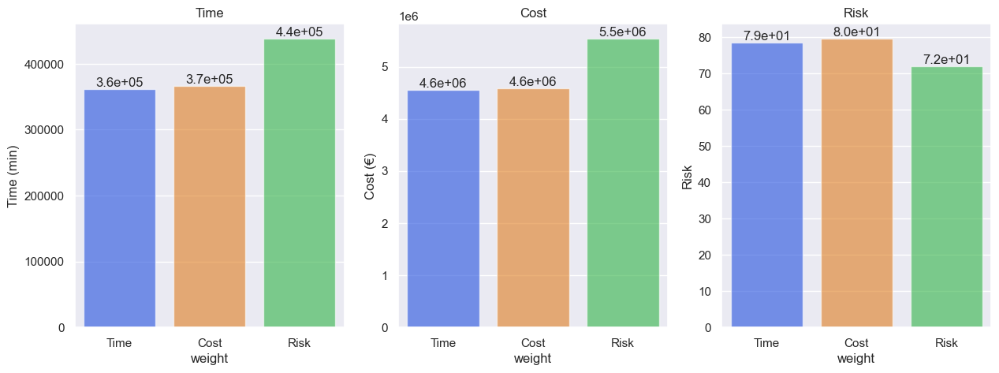

In [37]:
f, ax = plt.subplots(1,3,figsize=(15,5))
y_labels = ['Time (min)', 'Cost (€)', 'Risk']
labels = ['Time', 'Cost', 'Risk']

#TODO: multiply

grouped_lst = []

#TODO: multiply

for i in range(3):
    edges_df = edges_df_lst[i]
    edges_df.loc[edges_df['length']== 0,'modality'] = 'no modality'
    edges_df['Cost'] = edges_df['cost']*edges_df['count']
    edges_df['Time'] = edges_df['travel_time']*edges_df['count']
    edges_df['Risk'] = edges_df['risk']*edges_df['count']
    edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()

    edges_routes_grouped['weight'] = labels[i]
    grouped_lst.append(edges_routes_grouped)


edges_routes_grouped2 = pd.concat(grouped_lst)

edges_routes_grouped2 = edges_routes_grouped2.groupby('weight', as_index=False).sum()

    


for i in range(3):
        ax[i] = sns.barplot(
        data=edges_routes_grouped2,errorbar=None,
        x="weight", y=labels[i],
        palette="bright", alpha=.6, ax=ax[i], order=['Time', 'Cost', 'Risk'])


        # sns.countplot(x='modality', data=edges_df, ax= ax[i])
        for container in ax[i].containers:
            ax[i].bar_label(container, fmt='%.1e')

        # ax[i][j].legend(loc='upper left')

        # ax[i].bar_label(ax[i].containers[0])
        ax[i].set_title(labels[i])
        ax[i].set_ylabel(y_labels[i])

        # if i != 2:
        #     ax[i][j].set_xlabel('')
        # if j != 0:
        #     ax[i][j].set_ylabel('')
            

        # set labels

plt.show()

## Plotting labs to ports

In [38]:
small_coords_wr =[-74.0001388888889, 7.999861111111111, -72.99986111111112, 9.00013888888889]

d,  b, c, a = small_coords_wr
# small_coords_wr = [a,b,c,d]


# G_wrl_cnct = ox.truncate.truncate_graph_bbox(G_tt, bbox = small_coords_wr, truncate_by_edge=False, retain_all=False)
G_list_ports = [G_ports_time, G_ports_cost,  G_ports_risk]
G_names = ['Travel Time',"Cost",  'Risk']

air_edges = gf.get_edges_wth_attr(S0_un, 'type', 'air')
sea_edges = gf.get_edges_wth_attr(S0_un, 'type', 'sea')


S0_un_noair = S0_un.copy()
S0_un_noair.remove_edges_from(air_edges)
S0_un_noair.remove_edges_from(sea_edges)



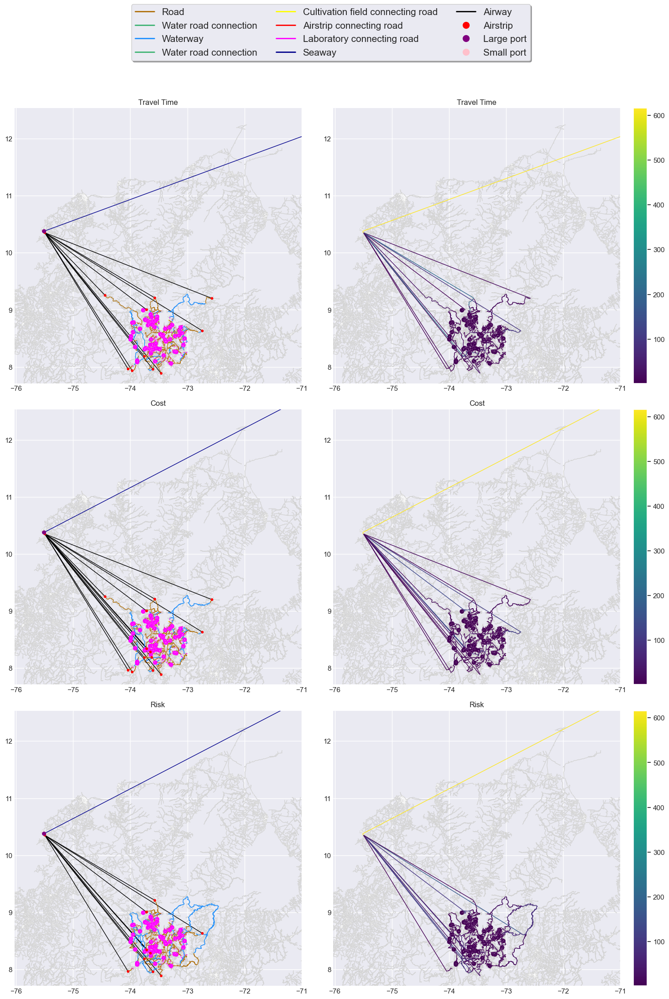

In [46]:


color_dct_edges = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", 'port_connect': "purple", 'port_connect_small': "darkblue", "sea": "darkblue", 'air': 'black'}
color_dct_edges_leg = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", "sea": "darkblue", 'air': 'black'}

color_dct_nodes = {'airstrip': 'red', 'port': 'purple', 'port_small': 'pink'}

legend_elements =[]
for key,val in color_dct_edges_leg.items():

    legend_elements.append(Line2D([0], [0], color=val, label=color_dct_en[key], lw=2, markerfacecolor=val, markersize=10))
for key,val in color_dct_nodes.items():

    legend_elements.append(Line2D([0], [0], marker='o', color=val, label=color_dct_nn[key], lw=0, markerfacecolor=val, markersize=10))

f, ax = plt.subplots(3,2,figsize=(15,20))



for i in range(3):
    G_weight = G_list_ports[i] 
    for j in range(2):
        if j ==1:
            ec = ox.plot.get_edge_colors_by_attr(G_weight, "count", cmap='viridis')
        else:
            edges =  G_weight.edges(data=True)
            ec = [color_dct_edges.get(d['type']) for u,v,d in edges]
        


        # bbox_small = [9.00013888888889, 7.999861111111111, -72.99986111111112, -74.0001388888889]

        bbox_small = [12.533, 7.711, -71, -76.026]
        ox.plot_graph(S0_un_noair, node_color='white', node_size=0.1, edge_linewidth = 1, edge_color='lightgrey', ax=ax[i][j], show=False, bbox = bbox_small )
        ox.plot_graph(G_weight, node_color='white', node_size=0.1, edge_linewidth = 1, edge_color=ec, ax=ax[i][j], show=False, bbox=bbox_small)


            
        # show(dac.data, ax=ax, transform=dac.rio.transform())

        if j == 0:
            n,e = ox.utils_graph.graph_to_gdfs(G_weight)
            typelst = ['port', 'port_small']
            n_select = n.loc[n['type'].isin(typelst)]
            n_select = n_select.apply(coloring, axis=1)

            n_select_air = n.loc[n['type'] == 'airstrip']
            n_select_air = n_select_air.apply(coloring, axis=1)

            n_select_air.plot(ax=ax[i][j], color=n_select_air['color'], markersize = 10)
            n_select.plot(ax=ax[i][j], color=n_select['color'], markersize = 30)



        # if j == 0:
        #     ax[i][j].legend(handles=legend_elements, loc='best')
        if j == 1:
            attr = nx.get_edge_attributes(G_weight, 'count')

            cmap = 'viridis'
            norm = mpl.colors.Normalize(vmin=min(attr.values()), vmax=max(attr.values()))

            f.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax[i][j], fraction=0.046, pad=0.04)

        ax[i][j].set_aspect('equal')

        ax[i][j].get_xaxis().set_visible(True)
        ax[i][j].get_yaxis().set_visible(True)
        ax[i][j].set_title(G_names[i])

# f.legend(handles=legend_elements, loc='upper center')

f.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.1),
          ncol=3, fancybox=True, shadow=True, fontsize=15)

f.tight_layout()

plt.show()




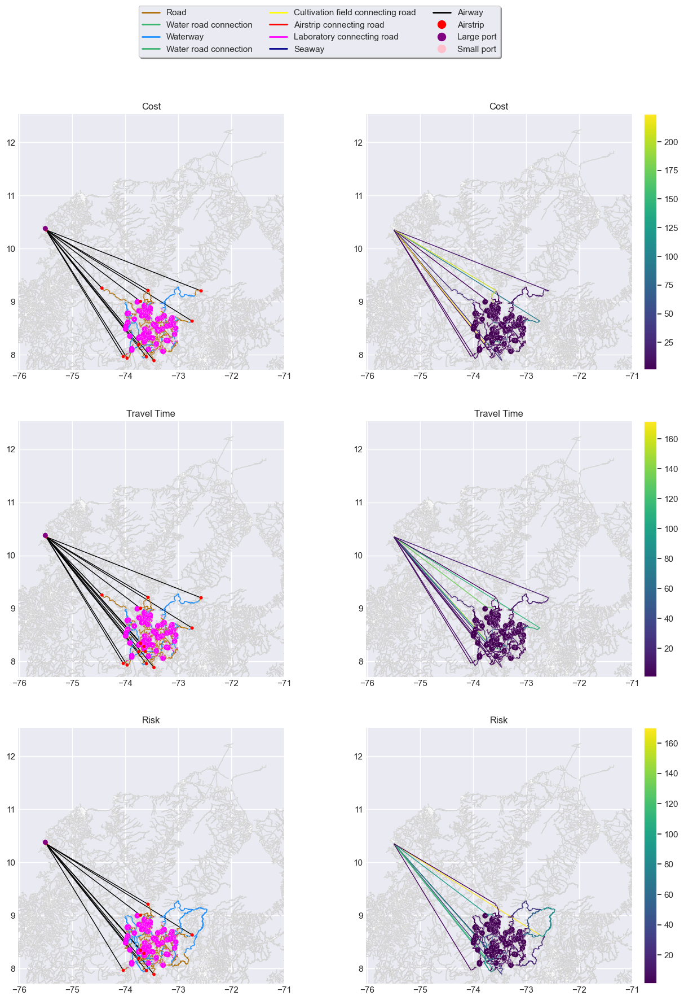

In [ ]:



color_dct_edges = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", 'port_connect': "purple", 'port_connect_small': "darkblue", "sea": "darkblue", 'air': 'black'}
color_dct_edges_leg = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", "sea": "darkblue", 'air': 'black'}

color_dct_nodes = {'airstrip': 'red', 'port': 'purple', 'port_small': 'pink'}

legend_elements =[]
for key,val in color_dct_edges_leg.items():

    legend_elements.append(Line2D([0], [0], color=val, label=color_dct_en[key], lw=2, markerfacecolor=val, markersize=10))
for key,val in color_dct_nodes.items():

    legend_elements.append(Line2D([0], [0], marker='o', color=val, label=color_dct_nn[key], lw=0, markerfacecolor=val, markersize=10))

f, ax = plt.subplots(3,2,figsize=(15,20))



for i in range(3):
    G_weight = G_list_ports[i].copy()
    for j in range(2):

        if j ==1:
            attr = nx.get_edge_attributes(G_weight, 'count')
            node_lst=[k for k,v in attr.items() if v > 550]
            G_weight.remove_edges_from(node_lst)

            # sea_edges = gf.get_edges_wth_attr(G_weight, 'type', 'sea')
            # G_weight.remove_edges_from(sea_edges)
            # sea_edges = gf.get_edges_wth_attr(G_weight, 'type', 'port_connect')
            # G_weight.remove_edges_from(sea_edges)
            # sea_edges = gf.get_edges_wth_attr(G_weight, 'type', 'airstrip_connect')
            # G_weight.remove_edges_from(sea_edges)

            ec = ox.plot.get_edge_colors_by_attr(G_weight, "count", cmap='viridis')
        else:
            

            edges =  G_weight.edges(data=True)
            ec = [color_dct_edges.get(d['type']) for u,v,d in edges]
        



        bbox_small = [12.533, 7.711, -71, -76.026]
        ox.plot_graph(S0_un_noair, node_color='white', node_size=0.1, edge_linewidth = 1, edge_color='lightgrey', ax=ax[i][j], show=False, bbox = bbox_small )
        ox.plot_graph(G_weight, node_color='white', node_size=0.1, edge_linewidth = 1, edge_color=ec, ax=ax[i][j], show=False, bbox=bbox_small)


            
        # show(dac.data, ax=ax, transform=dac.rio.transform())

        if j == 0:
            n,e = ox.utils_graph.graph_to_gdfs(G_weight)
            typelst = ['port', 'port_small']
            n_select = n.loc[n['type'].isin(typelst)]
            n_select = n_select.apply(coloring, axis=1)

            n_select_air = n.loc[n['type'] == 'airstrip']
            n_select_air = n_select_air.apply(coloring, axis=1)

            n_select_air.plot(ax=ax[i][j], color=n_select_air['color'], markersize = 10)
            n_select.plot(ax=ax[i][j], color=n_select['color'], markersize = 30)

        # if j == 0:
        #     ax[i][j].legend(handles=legend_elements, loc='best')
        if j == 1:
            attr = nx.get_edge_attributes(G_weight, 'count')

            cmap = 'viridis'
            norm = mpl.colors.Normalize(vmin=min(attr.values()), vmax=max(attr.values()))

            f.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax[i][j], fraction=0.046, pad=0.04)

        ax[i][j].set_aspect('equal')

        ax[i][j].get_xaxis().set_visible(True)
        ax[i][j].get_yaxis().set_visible(True)
        ax[i][j].set_title(G_names[i])

# f.legend(handles=legend_elements, loc='upper center')
f.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.05),
          ncol=3, fancybox=True, shadow=True, fontsize=15)

f.tight_layout()
plt.show()



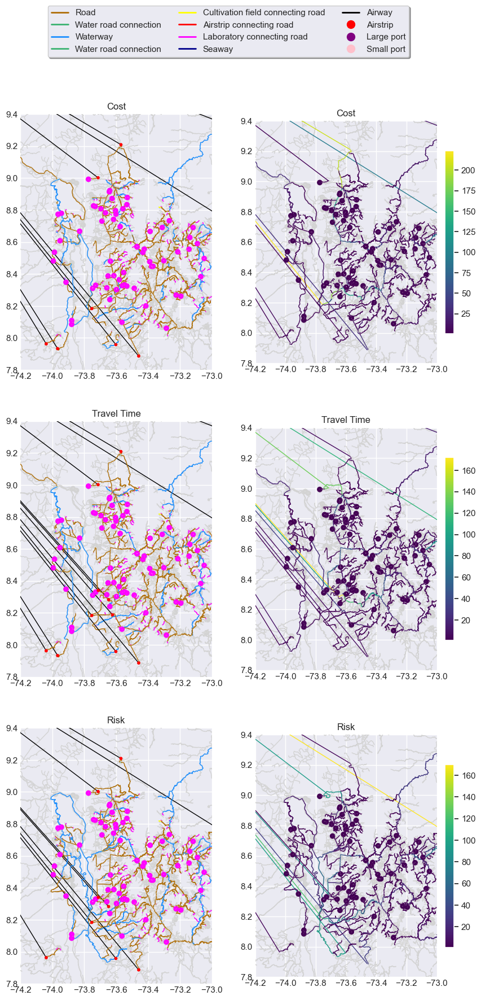

In [94]:


color_dct_edges = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", 'port_connect': "purple", 'port_connect_small': "darkblue", "sea": "darkblue", 'air': 'black'}
color_dct_edges_leg = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "mediumseagreen", 'field_connect': "yellow", 'airstrip_connect': "red", 'lab_connect': "magenta", "sea": "darkblue", 'air': 'black'}

color_dct_nodes = {'airstrip': 'red', 'port': 'purple', 'port_small': 'pink'}

legend_elements =[]
for key,val in color_dct_edges_leg.items():

    legend_elements.append(Line2D([0], [0], color=val, label=color_dct_en[key], lw=2, markerfacecolor=val, markersize=10))
for key,val in color_dct_nodes.items():

    legend_elements.append(Line2D([0], [0], marker='o', color=val, label=color_dct_nn[key], lw=0, markerfacecolor=val, markersize=10))

f, ax = plt.subplots(3,2,figsize=(10,20))



for i in range(3):
    G_weight = G_list_ports[i].copy()
    for j in range(2):
        if j ==1:
            attr = nx.get_edge_attributes(G_weight, 'count')
            node_lst=[k for k,v in attr.items() if v > 550]
            G_weight.remove_edges_from(node_lst)


            ec = ox.plot.get_edge_colors_by_attr(G_weight, "count", cmap='viridis')
        else:

            edges =  G_weight.edges(data=True)
            ec = [color_dct_edges.get(d['type']) for u,v,d in edges]
        


        bbox_small = [9.4, 7.8, -72.99986111111112, -74.2]

        # bbox_small = [12.533, 7.711, -71, -76.026]
        ox.plot_graph(S0_un_noair, node_color='white', node_size=0.1, edge_linewidth = 1, edge_color='lightgrey', ax=ax[i][j], show=False, bbox = bbox_small )
        ox.plot_graph(G_weight, node_color='white', node_size=0.1, edge_linewidth = 1, edge_color=ec, ax=ax[i][j], show=False, bbox=bbox_small)


            
        # show(dac.data, ax=ax, transform=dac.rio.transform())

        if j == 0:
            n,e = ox.utils_graph.graph_to_gdfs(G_weight)
            typelst = ['port', 'port_small']
            n_select = n.loc[n['type'].isin(typelst)]
            n_select = n_select.apply(coloring, axis=1)

            n_select_air = n.loc[n['type'] == 'airstrip']
            n_select_air = n_select_air.apply(coloring, axis=1)

            n_select_air.plot(ax=ax[i][j], color=n_select_air['color'], markersize = 10)
            n_select.plot(ax=ax[i][j], color=n_select['color'], markersize = 30)



        # if j == 0:
        #     ax[i][j].legend(handles=legend_elements, loc='best')
        if j == 1:
            attr = nx.get_edge_attributes(G_weight, 'count')

            cmap = 'viridis'
            norm = mpl.colors.Normalize(vmin=min(attr.values()), vmax=max(attr.values()))

            f.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax[i][j], fraction=0.046, pad=0.04)

        ax[i][j].set_aspect('equal')

        ax[i][j].get_xaxis().set_visible(True)
        ax[i][j].get_yaxis().set_visible(True)
        ax[i][j].set_title(G_names[i])

# f.legend(handles=legend_elements, loc='upper center')

f.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 0.98),
          ncol=3, fancybox=True, shadow=True)


plt.show()




In [ ]:


# color_dct_edges = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "xkcd:light mint", 'field_connect': "yellow", 'water_road_overside': "darkblue", 'airstrip_connect': "red", 'lab_connect': "darkorange", 'transhipment_airstrip': "darkred", 'transhipment_port': "limegreen", 'port_connect': "darkgreen", "sea": "darkorange", 'air': 'black'}

# legend_elements =[]
# for key,val in color_dct_edges.items():

#     legend_elements.append(Line2D([0], [0], marker='o', color=val, label=key, lw=0, markerfacecolor=val, markersize=10))


# f, ax = plt.subplots(3,2,figsize=(20,20))



# for i in range(3):
#     G_weight = G_list_ports[i] 
#     for j in range(2):
#         if j ==1:
#             ec = ox.plot.get_edge_colors_by_attr(G_weight, "count", cmap='viridis')
#         else:
#             edges =  G_weight.edges(data=True)
#             ec = [color_dct_edges.get(d['type']) for u,v,d in edges]


#         bbox_small = [11.1, 10, -74, -76]
#         ox.plot_graph(S0_un_noair, node_color='white', node_size=0.1, node_zorder=2, edge_linewidth = 2, edge_color='lightgrey', ax=ax[i][j], show=False, bbox = bbox_small )
#         ox.plot_graph(G_weight, node_color='white', node_size=0.1, node_zorder=2, edge_linewidth = 2, edge_color=ec, ax=ax[i][j], show=False, bbox=bbox_small)


            
#         # show(dac.data, ax=ax, transform=dac.rio.transform())



#         # if j == 0:
#         #     ax[i][j].legend(handles=legend_elements, loc='best')
#         if j == 1:
#             attr = nx.get_edge_attributes(G_weight, 'count')

#             cmap = 'viridis'
#             norm = mpl.colors.Normalize(vmin=min(attr.values()), vmax=max(attr.values()))

#             f.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax[i][j], fraction=0.046, pad=0.04)

#         ax[i][j].set_aspect('equal')

#         ax[i][j].get_xaxis().set_visible(True)
#         ax[i][j].get_yaxis().set_visible(True)
#         ax[i][j].set_title(G_names[i])

# # f.legend(handles=legend_elements, loc='upper center')


# plt.show()




In [ ]:

# color_dct_edges = {'road': "xkcd:caramel", 'water_road': "mediumseagreen", 'water': "dodgerblue", 'water_road_overside': "xkcd:light mint", 'field_connect': "yellow", 'water_road_overside': "darkblue", 'airstrip_connect': "red", 'lab_connect': "darkorange", 'transhipment_airstrip': "darkred", 'transhipment_port': "limegreen", 'port_connect': "darkgreen", "sea": "darkorange", 'air': 'black'}

# legend_elements =[]
# for key,val in color_dct_edges.items():

#     legend_elements.append(Line2D([0], [0], marker='o', color=val, label=key, lw=0, markerfacecolor=val, markersize=10))


# f, ax = plt.subplots(3,2,figsize=(10,20))



# for i in range(3):
#     G_weight = G_list_ports[i] 
#     for j in range(2):
#         if j ==1:
#             ec = ox.plot.get_edge_colors_by_attr(G_weight, "count", cmap='viridis')
#         else:
#             edges =  G_weight.edges(data=True)
#             ec = [color_dct_edges.get(d['type']) for u,v,d in edges]


#         bbox_small = [9, 7.7, -72, -73]
#         ox.plot_graph(S0_un_noair, node_color='white', node_size=0.1, node_zorder=2, edge_linewidth = 2, edge_color='lightgrey', ax=ax[i][j], show=False, bbox = bbox_small )
#         ox.plot_graph(G_weight, node_color='white', node_size=0.1, node_zorder=2, edge_linewidth = 2, edge_color=ec, ax=ax[i][j], show=False, bbox=bbox_small)


            
#         # show(dac.data, ax=ax, transform=dac.rio.transform())



#         # if j == 0:
#         #     ax[i][j].legend(handles=legend_elements, loc='best')
#         if j == 1:
#             attr = nx.get_edge_attributes(G_weight, 'count')

#             cmap = 'viridis'
#             norm = mpl.colors.Normalize(vmin=min(attr.values()), vmax=max(attr.values()))

#             f.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax[i][j], fraction=0.046, pad=0.04)

#         ax[i][j].set_aspect('equal')

#         ax[i][j].get_xaxis().set_visible(True)
#         ax[i][j].get_yaxis().set_visible(True)
#         ax[i][j].set_title(G_names[i])

# # f.legend(handles=legend_elements, loc='upper center')


# plt.show()

In [24]:
G_list_ports = [G_ports_time, G_ports_cost, G_ports_risk]
nodes_cost, edges_cost = ox.utils_graph.graph_to_gdfs(G_ports_cost)
nodes_risk, edges_risk = ox.utils_graph.graph_to_gdfs(G_ports_risk)
nodes_time, edges_time = ox.utils_graph.graph_to_gdfs(G_ports_time)

In [25]:
# edges_routes_clipped = edges_routes[['length', 'modality', 'grade', 'grade_abs',
#        'speed_kph', 'travel_time', 'count']]

In [26]:
edges_df_lst = [edges_time, edges_cost, edges_risk]
G_names = ["Cost", 'Travel Time', 'Risk']


In [27]:
for df in edges_df_lst:
    df.loc[df['modality'] == 'feeder', 'modality'] = 'ship'
    df.loc[df['modality'] == 'vessel', 'modality'] = 'ship'
edges_df_lst = [edges_time, edges_cost, edges_risk]


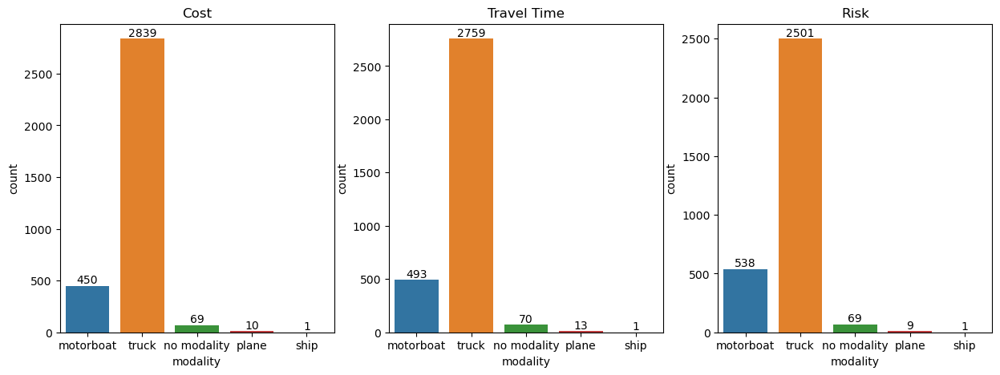

In [28]:
#TODO: plot count above bar

f, ax = plt.subplots(1,3,figsize=(15,5))

for i in range(3):
    edges_df = edges_df_lst[i]
    edges_df.loc[edges_df['length']== 0,'modality'] = 'no modality'

    # edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
    # sns.barplot(edges_routes_grouped, x="modality", y="count", ax=ax[i])

    sns.countplot(x='modality', data=edges_df, ax= ax[i])
    ax[i].bar_label(ax[i].containers[0])

    ax[i].set_title(G_names[i])

plt.show()



C:\Users\hanna\AppData\Local\Temp\ipykernel_16960\996619598.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_16960\996619598.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_16960\996619598.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or se

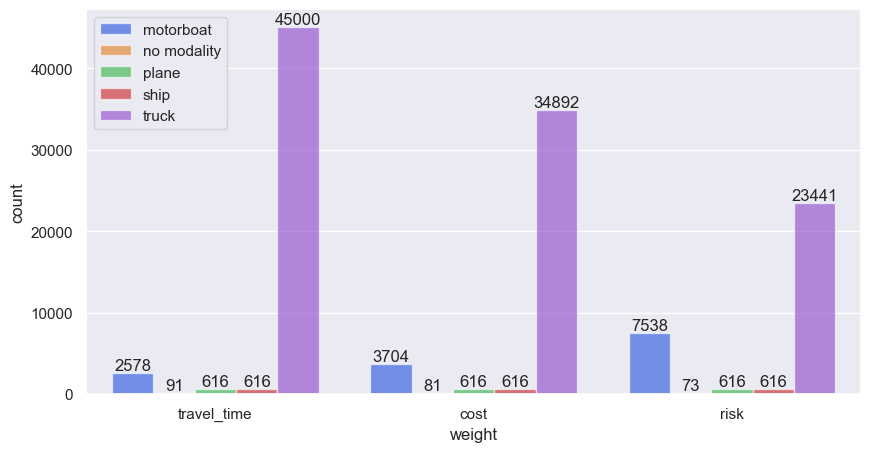

In [29]:

grouped_lst = []
labels = ['travel_time', 'cost', 'risk']


for i in range(3):
    edges_df = edges_df_lst[i]
    edges_df.loc[edges_df['length']== 0,'modality'] = 'no modality'

    edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()

    edges_routes_grouped['weight'] = labels[i]
    grouped_lst.append(edges_routes_grouped)


edges_routes_grouped = pd.concat(grouped_lst)
    
# sns.barplot(edges_routes_grouped, x="modality", y="count", ax=ax[i])

# f, ax = plt.subplots(figsize=(15,5))


sns.set(rc={"figure.figsize":(10, 5)}) #width=6, height=5

ax = sns.barplot(
    data=edges_routes_grouped,
    x="weight", y="count", hue="modality",
    palette="bright", alpha=.6
)


# sns.countplot(x='modality', data=edges_df, ax= ax[i])
for container in ax.containers:
    ax.bar_label(container)

ax.legend(loc='upper left')

# ax.set_title(G_names[i])

plt.show()

C:\Users\hanna\AppData\Local\Temp\ipykernel_16960\3112106008.py:18: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_16960\3112106008.py:18: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_16960\3112106008.py:18: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only

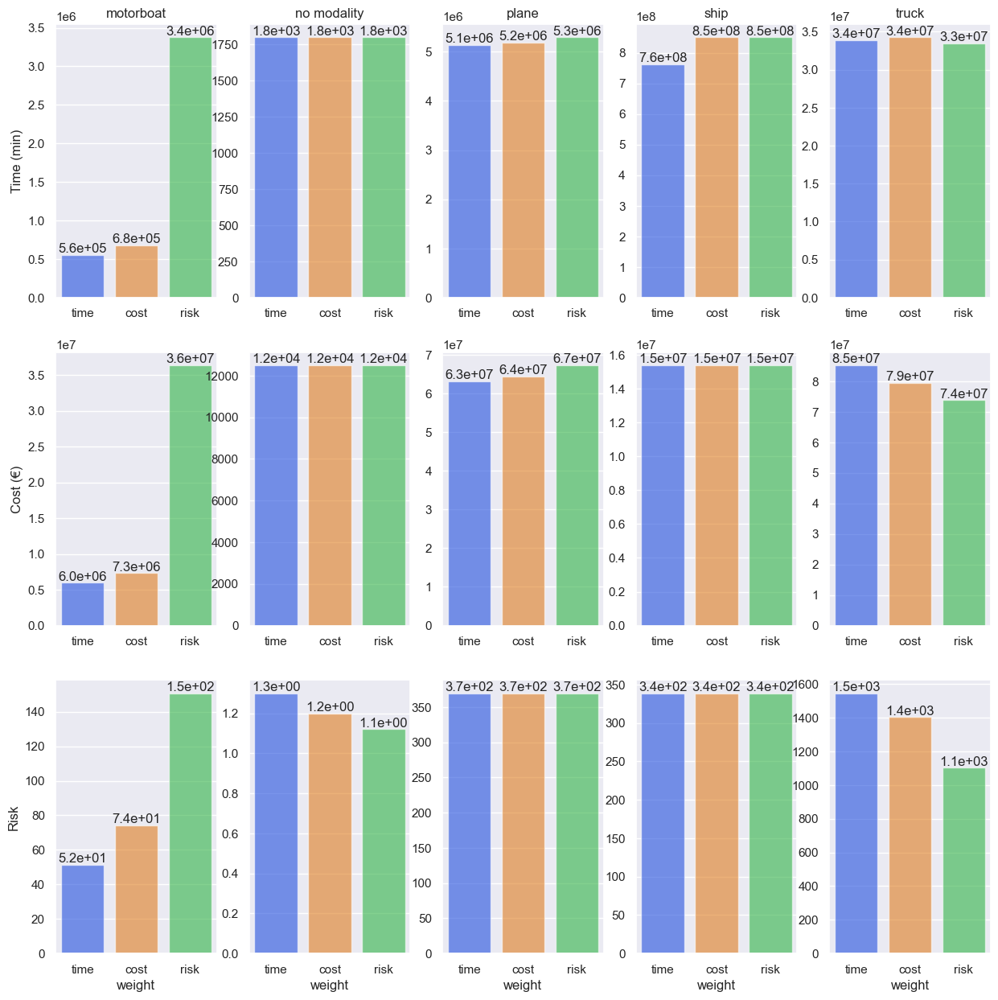

In [30]:
f, ax = plt.subplots(3,5,figsize=(15,15))
labels = ['time', 'cost', 'risk']
y_labels = ['Time (min)', 'Cost (€)', 'Risk']


#TODO: multiply

grouped_lst = []

#TODO: multiply

for i in range(3):
    edges_df = edges_df_lst[i]
    edges_df.loc[edges_df['length']== 0,'modality'] = 'no modality'
    edges_df['cost'] = edges_df['cost']*edges_df['count']
    edges_df['time'] = edges_df['travel_time']*edges_df['count']
    edges_df['risk'] = edges_df['risk']*edges_df['count']
    edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()

    edges_routes_grouped['weight'] = labels[i]
    grouped_lst.append(edges_routes_grouped)


edges_routes_grouped = pd.concat(grouped_lst)
    
modalities_lst = edges_routes_grouped['modality'].unique()


for i in range(3):
    for j in range(5):
        mod = modalities_lst[j]
        edges_routes_grouped_mod = edges_routes_grouped.loc[edges_routes_grouped['modality'] ==  mod]
        ax[i][j] = sns.barplot(
        data=edges_routes_grouped_mod,
        x="weight", y=labels[i],
        palette="bright", alpha=.6, ax=ax[i][j])


        # sns.countplot(x='modality', data=edges_df, ax= ax[i])
        for container in ax[i][j].containers:
            ax[i][j].bar_label(container, fmt='%.1e')

        # ax[i][j].legend(loc='upper left')

        # ax[i].bar_label(ax[i].containers[0])
        if i ==0:
            ax[i][j].set_title(mod)
        if i != 2:
            ax[i][j].set_xlabel('')
        if j != 0:
            ax[i][j].set_ylabel('')
        if j == 0:
            ax[i][j].set_ylabel(y_labels[i])

            

        # set labels

plt.show()

In [34]:
edges_df['cost'].sum()
edges_df['risk'].sum()
edges_df['travel_time'].sum()

2111702.3000000003

C:\Users\hanna\AppData\Local\Temp\ipykernel_16960\3710654357.py:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_16960\3710654357.py:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()
C:\Users\hanna\AppData\Local\Temp\ipykernel_16960\3710654357.py:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only

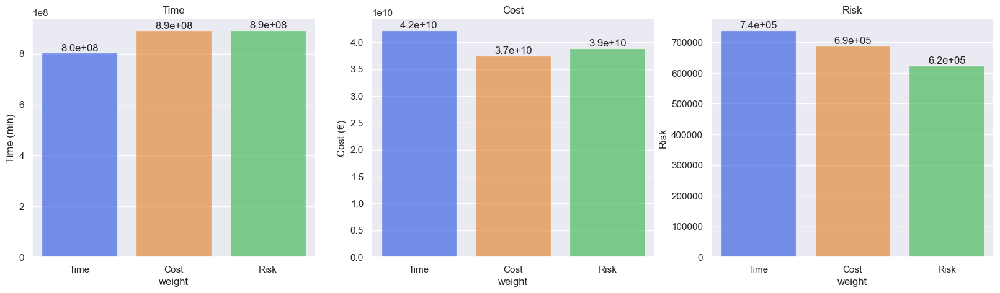

In [35]:
f, ax = plt.subplots(1,3,figsize=(20,5))
y_labels = ['Time (min)', 'Cost (€)', 'Risk']
labels = ['Time', 'Cost', 'Risk']

#TODO: multiply

grouped_lst = []

#TODO: multiply

for i in range(3):
    edges_df = edges_df_lst[i]
    edges_df.loc[edges_df['length']== 0,'modality'] = 'no modality'
    edges_df['Cost'] = edges_df['cost']*edges_df['count']
    edges_df['Time'] = edges_df['travel_time']*edges_df['count']
    edges_df['Risk'] = edges_df['risk']*edges_df['count']
    edges_routes_grouped = edges_df.groupby('modality', as_index=False).sum()

    edges_routes_grouped['weight'] = labels[i]
    grouped_lst.append(edges_routes_grouped)


edges_routes_grouped2 = pd.concat(grouped_lst)

edges_routes_grouped2 = edges_routes_grouped2.groupby('weight', as_index=False).sum()

    


for i in range(3):
        ax[i] = sns.barplot(
        data=edges_routes_grouped2,errorbar=None,
        x="weight", y=labels[i],
        palette="bright", alpha=.6, ax=ax[i], order=['Time', 'Cost', 'Risk'])


        # sns.countplot(x='modality', data=edges_df, ax= ax[i])
        for container in ax[i].containers:
            ax[i].bar_label(container, fmt='%.1e')

        # ax[i][j].legend(loc='upper left')

        # ax[i].bar_label(ax[i].containers[0])
        ax[i].set_title(labels[i])
        # if i != 2:
        #     ax[i][j].set_xlabel('')
        # if j != 0:
        ax[i].set_ylabel(y_labels[i])
            

        # set labels

plt.show()